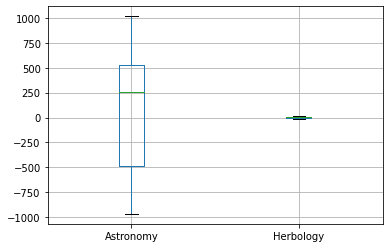

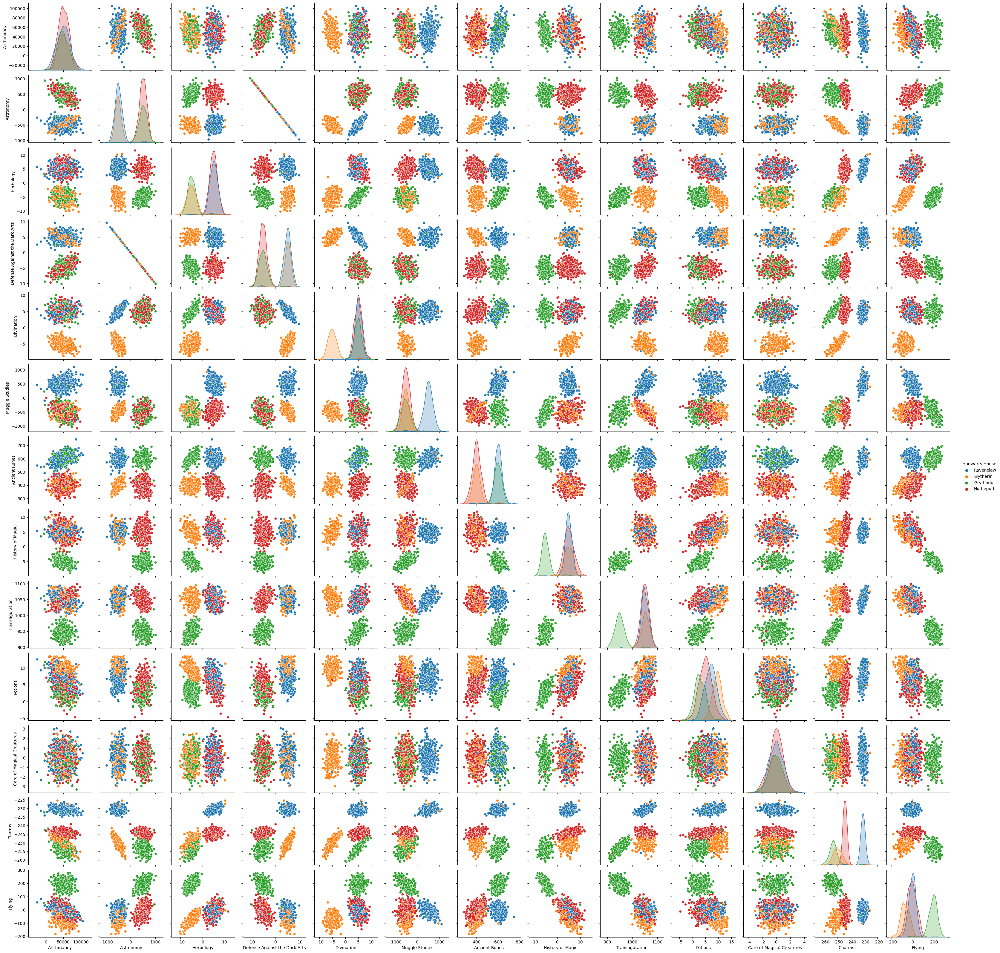

In [1]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from sklearn import datasets
import seaborn as sns
from sklearn import preprocessing

df = pd.read_csv("dataset_train.csv")
lst = ["Index","First Name","Last Name","Birthday","Best Hand"]
for col in lst:
    del df[col]

# df = df[(df[["Astronomy", "Herbology"]] >= 0).all(1)]
tmp_df = df[["Astronomy", "Herbology", 'Hogwarts House']]
tmp_df.drop_duplicates()

q75,q25 = np.percentile(tmp_df["Astronomy"],[75,25])
intr_qr = q75-q25
max = q75+(1.5*intr_qr)
min = q25-(1.5*intr_qr)
tmp_df.loc[tmp_df["Astronomy"] < min] = np.nan
tmp_df.loc[tmp_df["Astronomy"] > max] = np.nan
tmp_df = tmp_df.dropna()
tmp_df = tmp_df.reset_index(drop=True)

tmp_df.boxplot(["Astronomy", "Herbology"])
q75,q25 = np.percentile(tmp_df["Herbology"],[75,25])
intr_qr = q75-q25
max = q75+(1.5*intr_qr)
min = q25-(1.5*intr_qr)
tmp_df.loc[tmp_df["Herbology"] < min] =np.nan
tmp_df.loc[tmp_df["Herbology"] > max] =np.nan
tmp_df = tmp_df.dropna()
tmp_df = tmp_df.reset_index(drop=True)

min_max_scaler = preprocessing.MinMaxScaler()

X = min_max_scaler.fit_transform(tmp_df[["Astronomy", "Herbology"]])
X[np.isnan(X)] = 0

sns.pairplot(df, hue="Hogwarts House")

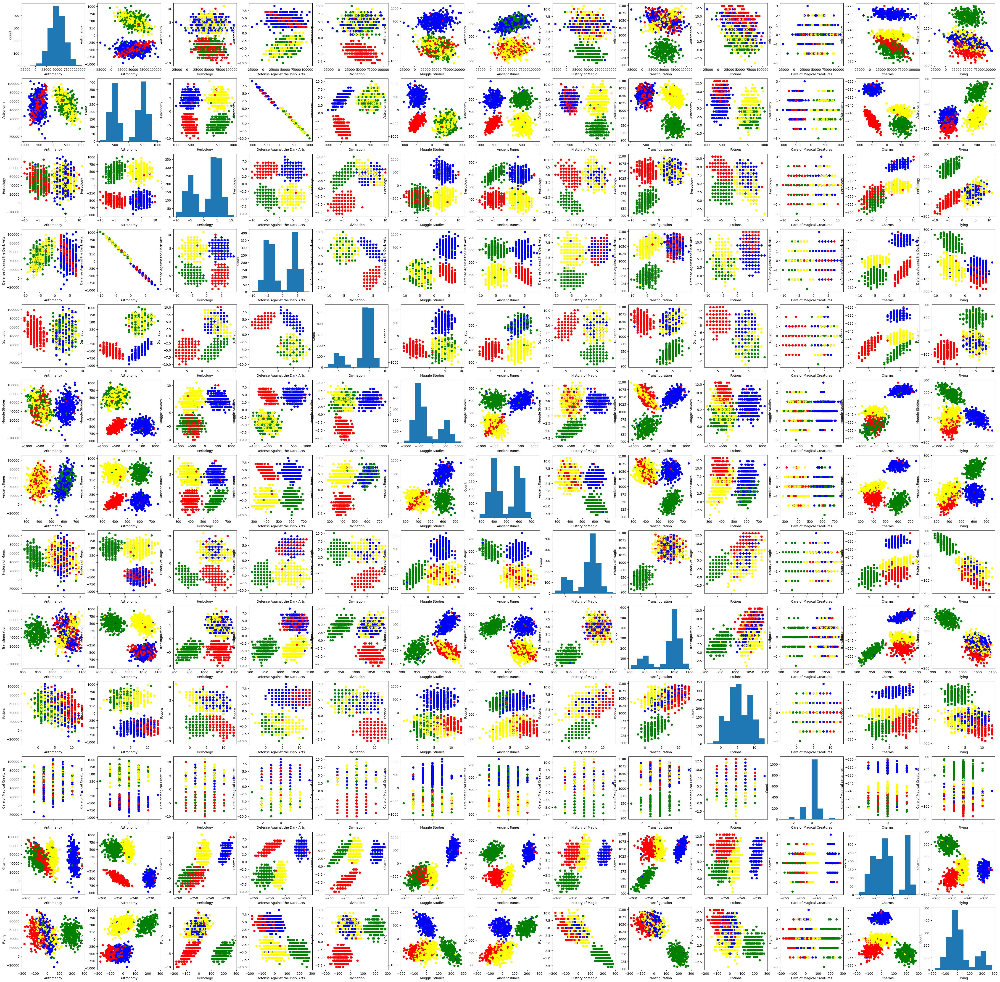

In [2]:
import matplotlib.pyplot as plt
import matplotlib

del_labels = ["First Name", "Last Name", 'Birthday', "Best Hand", "Index"]
with open("dataset_train.csv") as file:
    rows_list = file.read().splitlines()
    col_dict = {}
    labels = rows_list[0].split(',')
    for label in labels:
        col_dict[label] = []
    skip_ind = set()
    for row_ind in range(len(rows_list[1:])):
        values = rows_list[row_ind + 1].split(",")
        for index in range(len(col_dict)):
            col_dict[labels[index]].append(values[index])

def find_ind_empty(dct):
    # print(dct.keys())
    set_empty_val = set()
    for key, val_list in dct.items():
        for val_ind in range(len(val_list)):
            if val_list[val_ind] == '':
                set_empty_val.add(val_ind)
    return set_empty_val

def clean_empty_vals(dct):
    clean_ind = find_ind_empty(dct)
    tmp_dct = {}
    for key in dct.keys():
        tmp_dct[key] = []
    
        
    for key, val_list in dct.items():
        for val_ind in range(len(val_list)):
            if val_ind not in clean_ind:
                tmp_dct[key].append(val_list[val_ind])
    return tmp_dct

def convert_to_int(dct):
    for key, val_list in dct.items():
        for val_ind in range(len(val_list)):
            if key != "Hogwarts House":
                val_list[val_ind] = int(float(val_list[val_ind]))
    return dct

def get_majors(lst):
    majors = list(set(lst))
    colors = ['blue', 'green', 'yellow', 'red']
    majors_dct = dict()
    for major_ind in range(len(majors)):
        majors_dct[majors[major_ind]] = colors[major_ind]
    return majors_dct

def get_colors_dict(tmp_dct):
    colors_major = get_majors(tmp_dct["Hogwarts House"])
    tmp_dct["color"] = []
    for major in tmp_dct["Hogwarts House"]:
        tmp_dct["color"].append(colors_major[major])
    return tmp_dct["color"]

for label in del_labels:
    col_dict.pop(label)

fig, axs = plt.subplots(13, 13, figsize=(55, 55))

for col_1_ind in range(len(list(col_dict.keys()))):
    for col_2_ind in range(len(list(col_dict.keys()))):
        if list(col_dict.keys())[col_1_ind] != "Hogwarts House" and list(col_dict.keys())[col_2_ind] != "Hogwarts House":
            tmp_dct = {"Hogwarts House": col_dict["Hogwarts House"], list(col_dict.keys())[col_1_ind]:col_dict[list(col_dict.keys())[col_1_ind]], list(col_dict.keys())[col_2_ind]:col_dict[list(col_dict.keys())[col_2_ind]]}
            tmp_dct = clean_empty_vals(tmp_dct)
            tmp_dct = convert_to_int(tmp_dct)

            colors = get_colors_dict(tmp_dct)
            colors = ['blue', 'green', 'yellow', 'red']
            if col_1_ind != col_2_ind:
                axs[col_1_ind - 1][col_2_ind - 1].scatter(tmp_dct[list(col_dict.keys())[col_1_ind]], tmp_dct[list(col_dict.keys())[col_2_ind]], c=tmp_dct["color"], cmap=matplotlib.colors.ListedColormap(tmp_dct["color"]))
                axs[col_1_ind - 1][col_2_ind - 1].set_ylabel(list(col_dict.keys())[col_1_ind])
                axs[col_1_ind - 1][col_2_ind - 1].set_xlabel(list(col_dict.keys())[col_2_ind])
            else:
                axs[col_1_ind - 1][col_2_ind - 1].hist(tmp_dct[list(col_dict.keys())[col_1_ind]])
                axs[col_1_ind - 1][col_2_ind - 1].set_xlabel(list(col_dict.keys())[col_1_ind])
                axs[col_1_ind - 1][col_2_ind - 1].set_ylabel("Count")

In [ ]:
print("Astronomy Herbology")